<img src = "http://www.evanmarie.com/content/files/notebook_images/gans_flower_banner.png" width = 700>

# My GAN Gave Me Flowers
## Image generation using the *102 Flower Categories* dataset

### ⇨ Importing the necessary libraries:

In [94]:
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T
import torchvision.transforms.functional as TF
import PIL
import random
import tarfile
import os
from urllib.request import urlretrieve
from zipfile import ZipFile
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline

### ⇨ Downloading and extracting the images:

In [96]:
data_url = "https://www.robots.ox.ac.uk/~vgg/data/flowers/102/102flowers.tgz"
urlretrieve(data_url, '102flowers.tgz')    
with tarfile.open('./102flowers.tgz', 'r:gz') as tar:
    tar.extractall(path='./data')

### ⇨ Establishing the path to the images for ImageFolder:

In [97]:
path = './data'
print(os.listdir(path)[0:5])

['jpg']


In [98]:
image_folder = path + "/jpg/" 
images_list = list(os.listdir(image_folder))
rand_images = (random.choices(images_list, k=6))

### ⇨ Viewing examples of image inputs before normalizing:

In [99]:
def view_image_examples(filename_list, image_folder, size=250):
    for image in filename_list:
        img = PIL.Image.open(image_folder + '/' + image)
        new_size = (size, size)
        img = TF.resize(img, size=size, max_size=size+100)
        transform = T.CenterCrop(size)
        img = transform(img)
        display(img)
        print('')

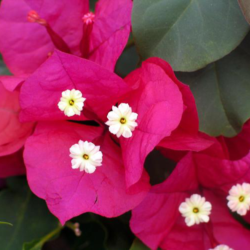

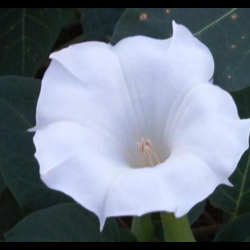

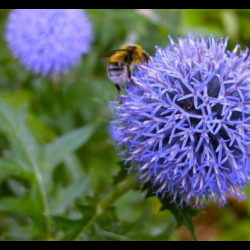

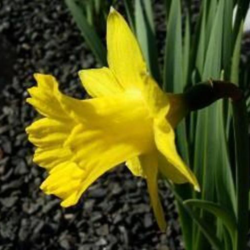

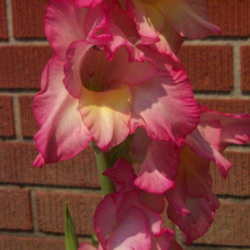

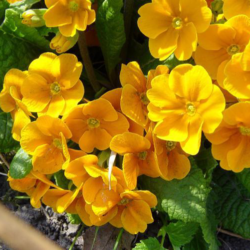

In [100]:
view_image_examples(rand_images, image_folder, size = 250)

### ⇨ Functions to denormalize and show images:

In [101]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [102]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

### ⇨ Image size and batch size definitions:

In [103]:
image_size = 64
batch_size = 128

### ⇨ Function to find the mean and standard deviation values from the dataset:

In [104]:
def find_mean_std(image_folder):
    import numpy as np
    import cv2
    from pathlib import Path

    image_directory = Path(image_folder)
    files = list(image_directory.rglob('*.jpg'))

    mean = np.array([0.,0.,0.])
    std_temp = np.array([0.,0.,0.])
    std = np.array([0.,0.,0.])

    num_samples = len(files)

    for i in range(num_samples):
        im = cv2.imread(str(files[i]))
        im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
        im = im.astype(float) / 255.

        for j in range(3):
            mean[j] += np.mean(im[:,:,j])

    mean = (mean/num_samples)

    for i in range(num_samples):
        im = cv2.imread(str(files[i]))
        im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
        im = im.astype(float) / 255.
    for j in range(3):
        std_temp[j] += ((im[:,:,j] - mean[j])**2).sum()/(im.shape[0]*im.shape[1])
        
    std = np.sqrt(std_temp/num_samples)
    print("Normalization mean: ", mean)
    print("Normalization std: ", std)
    
    return mean, std

#### In the final version of this project, I did not use these values, because they caused issues with the images.

In [105]:
# mean, std = find_mean_std(image_folder = image_folder)

### ⇨ Defining dataset and dataloader:

In [106]:
# stats = ((0.436, 0.378, 0.288), (0.003, 0.003, 0.004))
stats = ((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))

train_ds = ImageFolder(path, transform=T.Compose([
    T.Resize(image_size),
    T.CenterCrop(image_size),
    T.RandomRotation(30),
    T.ToTensor(),
    T.Normalize(*stats)]))


train_dl = DataLoader(train_ds, 
                      batch_size, 
                      shuffle=True,  
                      pin_memory=True)

### ⇨ A normalized image example:

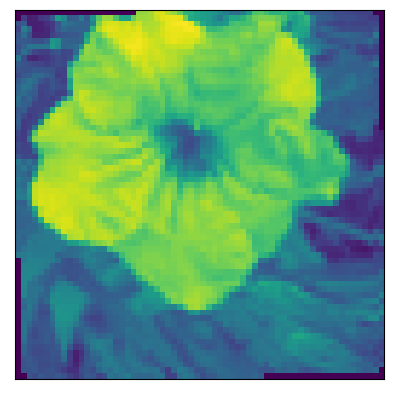

In [108]:
for images in range(5):
    for img_batch, label_batch in train_dl:
        plt.xticks([])
        plt.yticks([])
        plt.imshow(img_batch[0][0])
        break

### ⇨ GPU setup:

In [109]:
torch.cuda.is_available()

True

In [110]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [111]:
device = get_default_device()
device

device(type='cuda')

In [112]:
train_dl = DeviceDataLoader(train_dl, device)

### ⇨ Defining the discriminator:

In [113]:
import torch.nn as nn

In [114]:
discriminator = nn.Sequential(
    # in: 3 x 64 x 64
    
    # stride = 2 is why it goes from 64 to 32
    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

In [115]:
discriminator = to_device(discriminator, device)

### ⇨ Defining the generator:

In [116]:
latent_size = 128   # This number essentially determines the number of features to be found

In [117]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

torch.Size([128, 128, 1, 1])
torch.Size([128, 3, 64, 64])


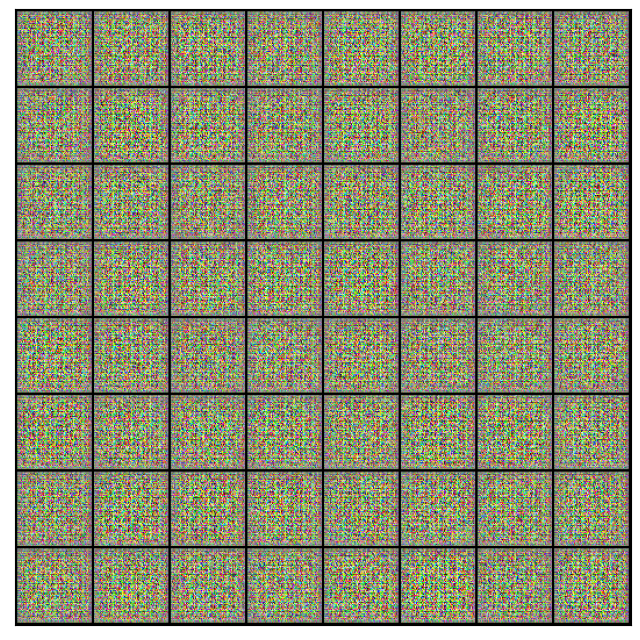

In [118]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
print(xb.shape)
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

In [119]:
generator = to_device(generator, device)

### ⇨ Training the discriminator:

In [120]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    # torch.ones() because real images should return 1, for yes, real
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    # torch.zeros(), because fake images should return 0, for no, not real
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

### ⇨ Training the generator:

In [121]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)
    
    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)
    
    # Update generator weights
    loss.backward()
    opt_g.step()
    
    return loss.item()

### ⇨ Function to save generated images during training:

In [ ]:
from torchvision.utils import save_image

In [123]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [127]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

### ⇨ Example of the random noise from which the flowers will bloom:

In [128]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-0000.png


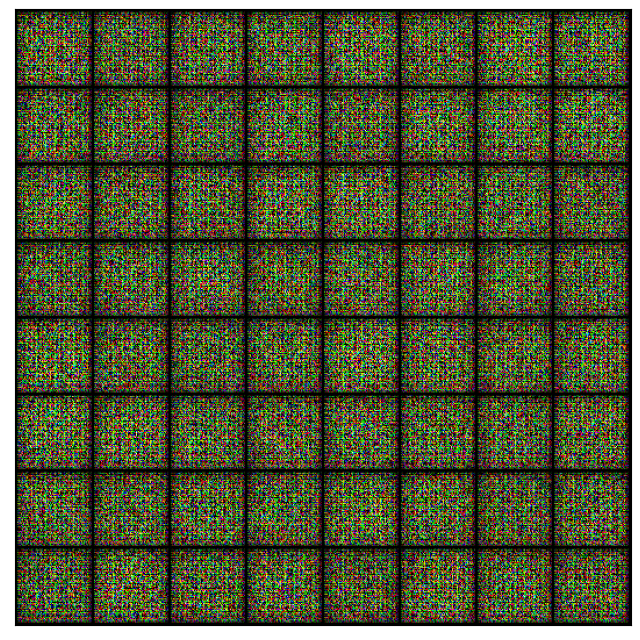

In [129]:
save_samples(0, fixed_latent)

### ⇨ Fit function that runs the training:

In [130]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [131]:
# start_idx is used for naming the files at the end of each epoch

def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()
    
    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []
    
    # Create optimizers - these specific betas are found to work well for this particular data
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    
    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)
            loss_g_02 = train_generator(opt_g)
            
        # Record losses & scores
        #losses_g.append(loss_g)
        losses_g.append(loss_g_02)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)
        
        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))
    
        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)
    
    return losses_g, losses_d, real_scores, fake_scores

### ⇨ Learning rate and number of epochs:

In [134]:
lr = 0.0002
epochs = 100

### ⇨ Training the model:

In [135]:
history = fit(epochs, lr)

  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [1/100], loss_g: 1.0079, loss_d: 1.4498, real_score: 0.4613, fake_score: 0.4724
Saving generated-images-0001.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [2/100], loss_g: 1.0777, loss_d: 1.3469, real_score: 0.4996, fake_score: 0.4685
Saving generated-images-0002.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [3/100], loss_g: 0.8808, loss_d: 1.4788, real_score: 0.4415, fake_score: 0.4718
Saving generated-images-0003.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [4/100], loss_g: 0.8674, loss_d: 1.3919, real_score: 0.4936, fake_score: 0.4831
Saving generated-images-0004.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [5/100], loss_g: 0.9792, loss_d: 1.3075, real_score: 0.5456, fake_score: 0.4980
Saving generated-images-0005.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [6/100], loss_g: 0.8375, loss_d: 1.4123, real_score: 0.4798, fake_score: 0.4874
Saving generated-images-0006.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [7/100], loss_g: 0.8203, loss_d: 1.4447, real_score: 0.4977, fake_score: 0.5164
Saving generated-images-0007.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [8/100], loss_g: 0.9708, loss_d: 1.4362, real_score: 0.5079, fake_score: 0.5255
Saving generated-images-0008.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [9/100], loss_g: 0.6815, loss_d: 1.4395, real_score: 0.4499, fake_score: 0.4678
Saving generated-images-0009.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [10/100], loss_g: 0.8480, loss_d: 1.4586, real_score: 0.4889, fake_score: 0.5189
Saving generated-images-0010.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [11/100], loss_g: 0.9205, loss_d: 1.3739, real_score: 0.5300, fake_score: 0.5182
Saving generated-images-0011.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [12/100], loss_g: 0.8436, loss_d: 1.3685, real_score: 0.5271, fake_score: 0.5119
Saving generated-images-0012.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [13/100], loss_g: 0.9555, loss_d: 1.4001, real_score: 0.5585, fake_score: 0.5535
Saving generated-images-0013.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [14/100], loss_g: 0.8277, loss_d: 1.3770, real_score: 0.5012, fake_score: 0.4906
Saving generated-images-0014.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [15/100], loss_g: 0.8356, loss_d: 1.3934, real_score: 0.4887, fake_score: 0.4839
Saving generated-images-0015.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [16/100], loss_g: 0.7724, loss_d: 1.3150, real_score: 0.4735, fake_score: 0.4274
Saving generated-images-0016.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [17/100], loss_g: 0.8337, loss_d: 1.3874, real_score: 0.4642, fake_score: 0.4550
Saving generated-images-0017.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [18/100], loss_g: 1.0919, loss_d: 1.4085, real_score: 0.5899, fake_score: 0.5791
Saving generated-images-0018.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [19/100], loss_g: 0.8627, loss_d: 1.3203, real_score: 0.4977, fake_score: 0.4540
Saving generated-images-0019.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [20/100], loss_g: 0.7294, loss_d: 1.3907, real_score: 0.4450, fake_score: 0.4310
Saving generated-images-0020.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [21/100], loss_g: 0.8832, loss_d: 1.3752, real_score: 0.5117, fake_score: 0.5004
Saving generated-images-0021.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [22/100], loss_g: 1.1216, loss_d: 1.3551, real_score: 0.6078, fake_score: 0.5704
Saving generated-images-0022.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [23/100], loss_g: 0.7810, loss_d: 1.3844, real_score: 0.4603, fake_score: 0.4498
Saving generated-images-0023.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [24/100], loss_g: 1.0694, loss_d: 1.3475, real_score: 0.5515, fake_score: 0.5202
Saving generated-images-0024.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [25/100], loss_g: 0.8251, loss_d: 1.3391, real_score: 0.4763, fake_score: 0.4432
Saving generated-images-0025.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [26/100], loss_g: 0.5597, loss_d: 1.4614, real_score: 0.3692, fake_score: 0.3566
Saving generated-images-0026.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [27/100], loss_g: 1.0419, loss_d: 1.2985, real_score: 0.5771, fake_score: 0.5182
Saving generated-images-0027.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [28/100], loss_g: 0.9871, loss_d: 1.4146, real_score: 0.5779, fake_score: 0.5724
Saving generated-images-0028.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [29/100], loss_g: 0.9127, loss_d: 1.3433, real_score: 0.4724, fake_score: 0.4375
Saving generated-images-0029.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [30/100], loss_g: 0.9026, loss_d: 1.3159, real_score: 0.4935, fake_score: 0.4470
Saving generated-images-0030.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [31/100], loss_g: 0.8226, loss_d: 1.3667, real_score: 0.4457, fake_score: 0.4196
Saving generated-images-0031.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [32/100], loss_g: 0.9617, loss_d: 1.3210, real_score: 0.5768, fake_score: 0.5295
Saving generated-images-0032.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [33/100], loss_g: 1.0437, loss_d: 1.2582, real_score: 0.5537, fake_score: 0.4797
Saving generated-images-0033.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [34/100], loss_g: 1.0229, loss_d: 1.2420, real_score: 0.5851, fake_score: 0.4986
Saving generated-images-0034.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [35/100], loss_g: 1.2370, loss_d: 1.3422, real_score: 0.6173, fake_score: 0.5664
Saving generated-images-0035.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [36/100], loss_g: 1.4276, loss_d: 1.5381, real_score: 0.7091, fake_score: 0.6871
Saving generated-images-0036.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [37/100], loss_g: 1.1491, loss_d: 1.3398, real_score: 0.6119, fake_score: 0.5615
Saving generated-images-0037.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [38/100], loss_g: 1.5156, loss_d: 1.3853, real_score: 0.7221, fake_score: 0.6415
Saving generated-images-0038.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [39/100], loss_g: 0.8683, loss_d: 1.3019, real_score: 0.4847, fake_score: 0.4237
Saving generated-images-0039.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [40/100], loss_g: 0.8020, loss_d: 1.2955, real_score: 0.4714, fake_score: 0.4054
Saving generated-images-0040.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [41/100], loss_g: 0.8652, loss_d: 1.2614, real_score: 0.4996, fake_score: 0.4208
Saving generated-images-0041.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [42/100], loss_g: 1.2562, loss_d: 1.2732, real_score: 0.5569, fake_score: 0.4823
Saving generated-images-0042.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [43/100], loss_g: 1.0984, loss_d: 1.3068, real_score: 0.5377, fake_score: 0.4831
Saving generated-images-0043.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [44/100], loss_g: 0.7187, loss_d: 1.3360, real_score: 0.4214, fake_score: 0.3548
Saving generated-images-0044.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [45/100], loss_g: 0.9596, loss_d: 1.2193, real_score: 0.5288, fake_score: 0.4307
Saving generated-images-0045.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [46/100], loss_g: 0.8818, loss_d: 1.2563, real_score: 0.4550, fake_score: 0.3554
Saving generated-images-0046.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [47/100], loss_g: 0.6779, loss_d: 1.2840, real_score: 0.4248, fake_score: 0.3182
Saving generated-images-0047.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [48/100], loss_g: 0.8527, loss_d: 1.2201, real_score: 0.4777, fake_score: 0.3568
Saving generated-images-0048.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [49/100], loss_g: 1.9608, loss_d: 1.5866, real_score: 0.7568, fake_score: 0.7089
Saving generated-images-0049.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [50/100], loss_g: 0.4499, loss_d: 1.4200, real_score: 0.3209, fake_score: 0.2090
Saving generated-images-0050.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [51/100], loss_g: 2.0325, loss_d: 1.3246, real_score: 0.7361, fake_score: 0.6250
Saving generated-images-0051.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [52/100], loss_g: 1.7729, loss_d: 1.2519, real_score: 0.7099, fake_score: 0.5797
Saving generated-images-0052.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [53/100], loss_g: 2.2880, loss_d: 1.2552, real_score: 0.7852, fake_score: 0.6212
Saving generated-images-0053.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [54/100], loss_g: 1.1722, loss_d: 1.1419, real_score: 0.5627, fake_score: 0.4099
Saving generated-images-0054.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [55/100], loss_g: 1.0023, loss_d: 1.1114, real_score: 0.5299, fake_score: 0.3539
Saving generated-images-0055.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [56/100], loss_g: 1.0180, loss_d: 1.2066, real_score: 0.6482, fake_score: 0.5188
Saving generated-images-0056.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [57/100], loss_g: 1.1574, loss_d: 0.9643, real_score: 0.6419, fake_score: 0.3891
Saving generated-images-0057.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [58/100], loss_g: 1.1415, loss_d: 1.1154, real_score: 0.5085, fake_score: 0.3280
Saving generated-images-0058.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [59/100], loss_g: 1.3799, loss_d: 1.0092, real_score: 0.7038, fake_score: 0.4628
Saving generated-images-0059.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [60/100], loss_g: 1.3531, loss_d: 1.1319, real_score: 0.6491, fake_score: 0.4831
Saving generated-images-0060.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [61/100], loss_g: 1.0847, loss_d: 1.0853, real_score: 0.5062, fake_score: 0.3067
Saving generated-images-0061.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [62/100], loss_g: 0.9718, loss_d: 1.0127, real_score: 0.5266, fake_score: 0.2749
Saving generated-images-0062.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [63/100], loss_g: 0.6049, loss_d: 1.3871, real_score: 0.3284, fake_score: 0.1800
Saving generated-images-0063.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [64/100], loss_g: 1.1702, loss_d: 1.1234, real_score: 0.6809, fake_score: 0.4997
Saving generated-images-0064.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [65/100], loss_g: 0.9815, loss_d: 0.9886, real_score: 0.5843, fake_score: 0.3363
Saving generated-images-0065.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [66/100], loss_g: 0.6666, loss_d: 1.3076, real_score: 0.3690, fake_score: 0.2153
Saving generated-images-0066.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [67/100], loss_g: 2.2080, loss_d: 1.0064, real_score: 0.7534, fake_score: 0.4928
Saving generated-images-0067.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [68/100], loss_g: 0.7233, loss_d: 1.2171, real_score: 0.3871, fake_score: 0.1775
Saving generated-images-0068.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [69/100], loss_g: 1.0046, loss_d: 1.1490, real_score: 0.4963, fake_score: 0.3185
Saving generated-images-0069.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [70/100], loss_g: 0.8680, loss_d: 1.0070, real_score: 0.4764, fake_score: 0.1911
Saving generated-images-0070.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [71/100], loss_g: 1.3454, loss_d: 0.8894, real_score: 0.5837, fake_score: 0.2629
Saving generated-images-0071.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [72/100], loss_g: 2.4108, loss_d: 1.3150, real_score: 0.8560, fake_score: 0.6583
Saving generated-images-0072.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [73/100], loss_g: 1.6155, loss_d: 0.9113, real_score: 0.6846, fake_score: 0.3850
Saving generated-images-0073.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [74/100], loss_g: 1.8990, loss_d: 0.9287, real_score: 0.7667, fake_score: 0.4557
Saving generated-images-0074.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [75/100], loss_g: 1.6983, loss_d: 0.8990, real_score: 0.6462, fake_score: 0.3395
Saving generated-images-0075.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [76/100], loss_g: 1.8875, loss_d: 0.8702, real_score: 0.7206, fake_score: 0.3915
Saving generated-images-0076.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [77/100], loss_g: 1.8250, loss_d: 1.0486, real_score: 0.7964, fake_score: 0.5303
Saving generated-images-0077.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [78/100], loss_g: 1.4500, loss_d: 0.9053, real_score: 0.6123, fake_score: 0.2968
Saving generated-images-0078.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [79/100], loss_g: 1.4510, loss_d: 0.8866, real_score: 0.6440, fake_score: 0.3234
Saving generated-images-0079.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [80/100], loss_g: 0.8290, loss_d: 1.5651, real_score: 0.2614, fake_score: 0.0894
Saving generated-images-0080.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [81/100], loss_g: 1.4237, loss_d: 0.8704, real_score: 0.6549, fake_score: 0.3276
Saving generated-images-0081.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [82/100], loss_g: 1.3552, loss_d: 0.7644, real_score: 0.6515, fake_score: 0.2476
Saving generated-images-0082.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [84/100], loss_g: 2.8000, loss_d: 1.1302, real_score: 0.8558, fake_score: 0.5825
Saving generated-images-0084.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [85/100], loss_g: 0.9573, loss_d: 0.8821, real_score: 0.5506, fake_score: 0.2009
Saving generated-images-0085.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [86/100], loss_g: 2.7600, loss_d: 0.8469, real_score: 0.8071, fake_score: 0.4427
Saving generated-images-0086.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [87/100], loss_g: 1.6112, loss_d: 0.7004, real_score: 0.6880, fake_score: 0.2447
Saving generated-images-0087.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [88/100], loss_g: 2.0736, loss_d: 0.7953, real_score: 0.8228, fake_score: 0.4118
Saving generated-images-0088.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [89/100], loss_g: 1.2389, loss_d: 0.7861, real_score: 0.6042, fake_score: 0.1968
Saving generated-images-0089.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [90/100], loss_g: 2.1481, loss_d: 0.9878, real_score: 0.7598, fake_score: 0.4597
Saving generated-images-0090.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [91/100], loss_g: 0.8868, loss_d: 0.9245, real_score: 0.4894, fake_score: 0.1246
Saving generated-images-0091.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [92/100], loss_g: 2.7967, loss_d: 0.7238, real_score: 0.8315, fake_score: 0.3770
Saving generated-images-0092.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [93/100], loss_g: 1.6885, loss_d: 0.7953, real_score: 0.5605, fake_score: 0.1281
Saving generated-images-0093.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [94/100], loss_g: 1.8219, loss_d: 0.6490, real_score: 0.6768, fake_score: 0.1867
Saving generated-images-0094.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [95/100], loss_g: 2.1895, loss_d: 0.6413, real_score: 0.8100, fake_score: 0.3228
Saving generated-images-0095.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [96/100], loss_g: 2.0297, loss_d: 0.5378, real_score: 0.7615, fake_score: 0.2037
Saving generated-images-0096.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [97/100], loss_g: 1.7033, loss_d: 0.7917, real_score: 0.6431, fake_score: 0.2465
Saving generated-images-0097.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [98/100], loss_g: 1.8333, loss_d: 0.7556, real_score: 0.7368, fake_score: 0.3231
Saving generated-images-0098.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [99/100], loss_g: 1.9059, loss_d: 0.5711, real_score: 0.7716, fake_score: 0.2372
Saving generated-images-0099.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [100/100], loss_g: 2.2836, loss_d: 0.6683, real_score: 0.8580, fake_score: 0.3686
Saving generated-images-0100.png


In [136]:
losses_g, losses_d, real_scores, fake_scores = history

### ⇨ Saving the generator and discriminator to file:

In [137]:
# Save the model checkpoints 
torch.save(generator.state_dict(), 'Generator_flowers.pth')
torch.save(discriminator.state_dict(), 'Discriminator_flowers.pth')

### ⇨ Examples of generated images over the course of training:

In [138]:
from IPython.display import Image

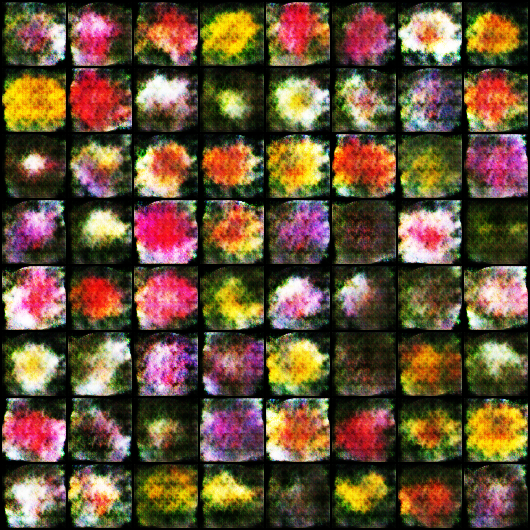

In [139]:
Image('./generated/generated-images-0001.png')

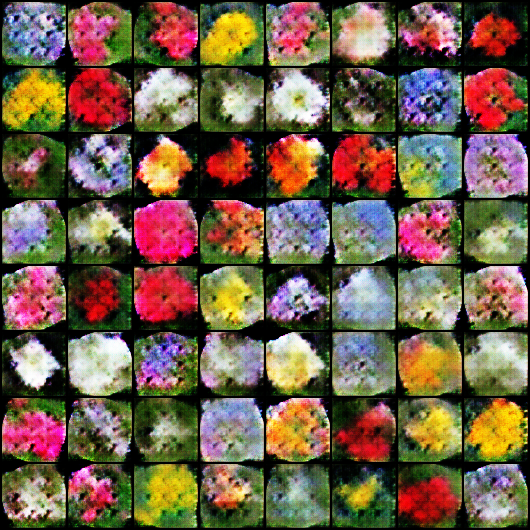

In [140]:
Image('./generated/generated-images-0005.png')

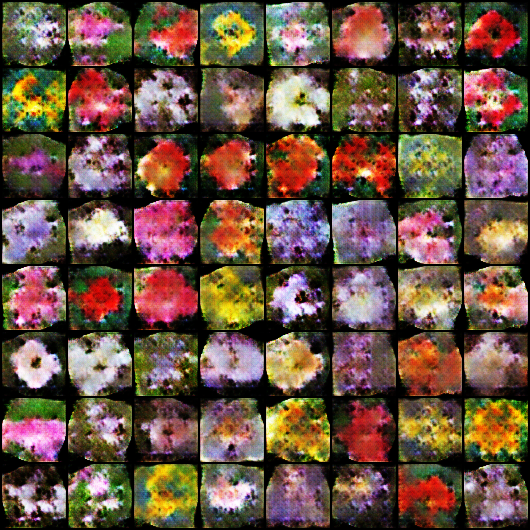

In [141]:
Image('./generated/generated-images-0010.png')

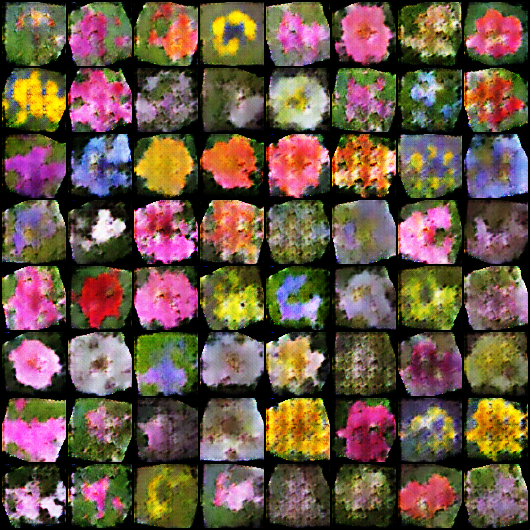

In [142]:
Image('./generated/generated-images-0020.png')

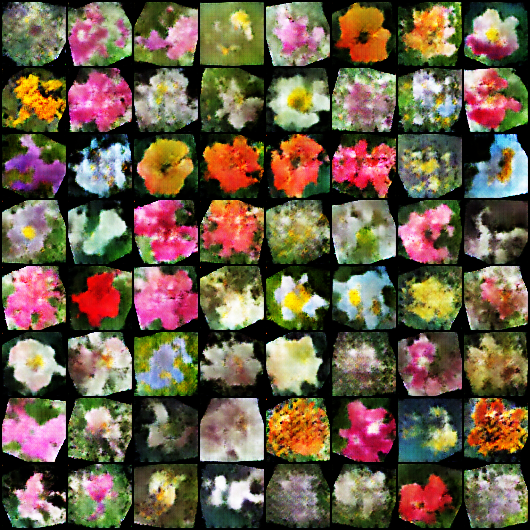

In [143]:
Image('./generated/generated-images-0030.png')

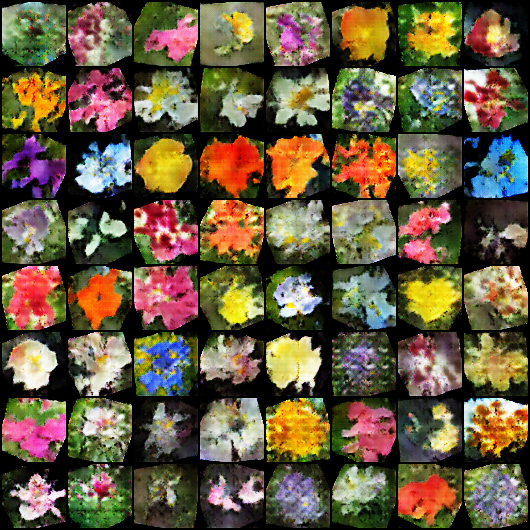

In [144]:
Image('./generated/generated-images-0040.png')

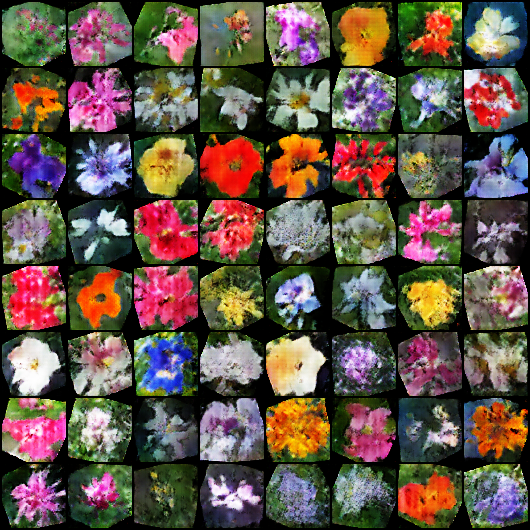

In [145]:
Image('./generated/generated-images-0050.png')

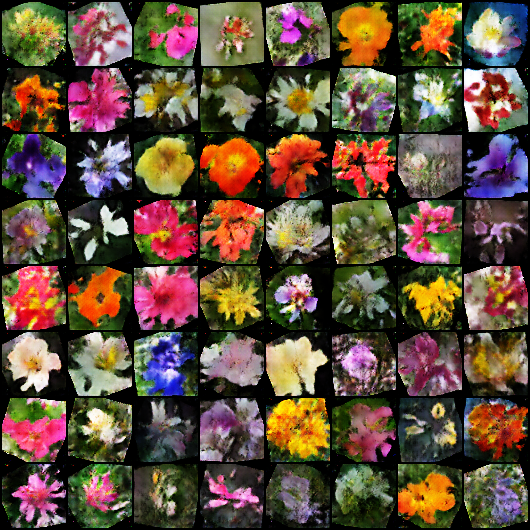

In [146]:
Image('./generated/generated-images-0060.png')

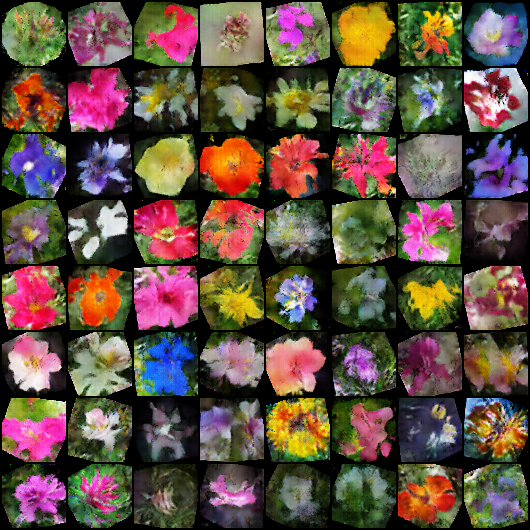

In [147]:
Image('./generated/generated-images-0070.png')

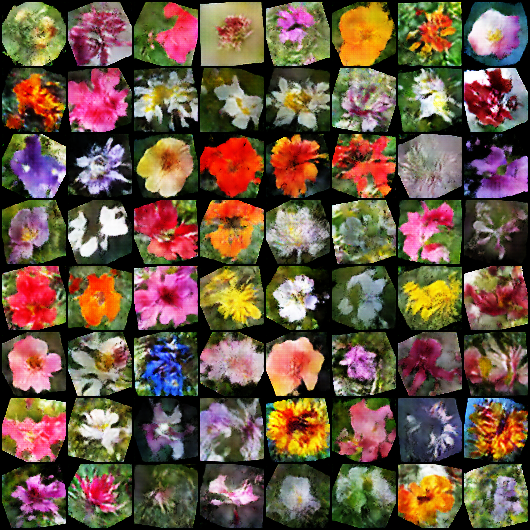

In [148]:
Image('./generated/generated-images-0080.png')

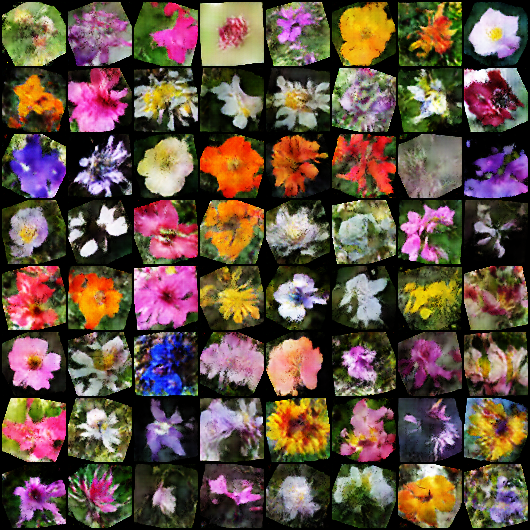

In [149]:
Image('./generated/generated-images-0090.png')

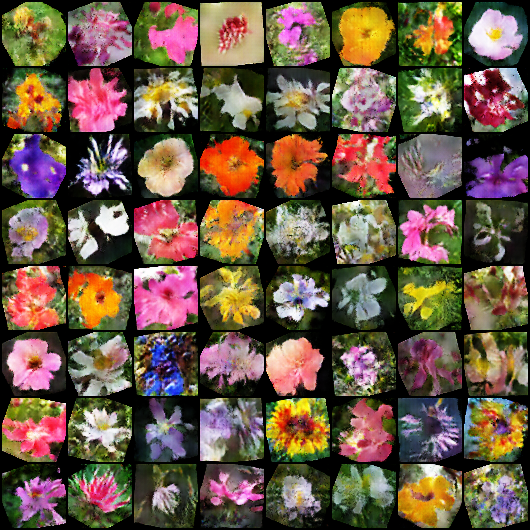

In [153]:
Image('./generated/generated-images-0100.png')

### ⇨ Creating a video slideshow of the images from each epoch of training:

In [154]:
!pip install opencv-python

In [155]:
import cv2
import os

vid_fname = 'gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 1, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

### ⇨ Plotting generator and discriminator losses:

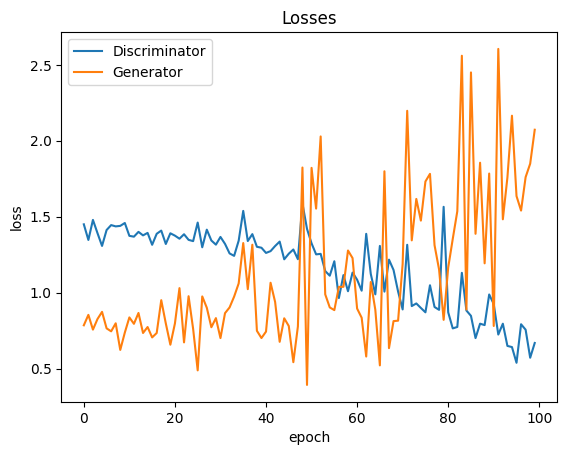

In [156]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

### ⇨ Plotting generator and discriminator scores:

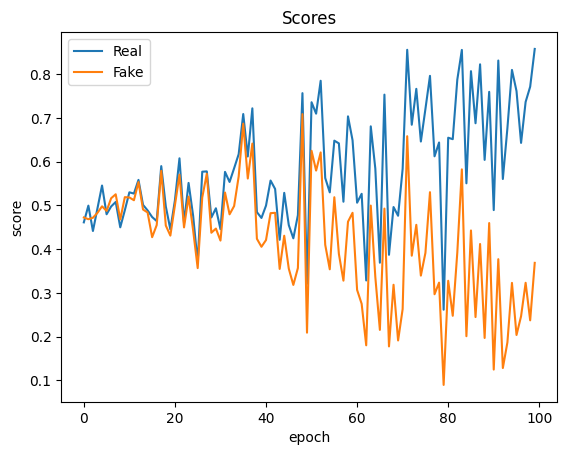

In [157]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');

## Retraining for 200 epochs (twice the last training) to get better results:

In [158]:
history02 = fit(200, 0.0002)

  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [1/200], loss_g: 2.1229, loss_d: 0.6221, real_score: 0.7985, fake_score: 0.2871
Saving generated-images-0001.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [2/200], loss_g: 2.3634, loss_d: 0.6181, real_score: 0.7960, fake_score: 0.2878
Saving generated-images-0002.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [3/200], loss_g: 1.9917, loss_d: 0.4824, real_score: 0.8432, fake_score: 0.2463
Saving generated-images-0003.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [4/200], loss_g: 3.0775, loss_d: 0.9373, real_score: 0.9016, fake_score: 0.5020
Saving generated-images-0004.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [5/200], loss_g: 2.7964, loss_d: 0.6253, real_score: 0.8935, fake_score: 0.3644
Saving generated-images-0005.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [6/200], loss_g: 1.4597, loss_d: 0.7430, real_score: 0.5686, fake_score: 0.0930
Saving generated-images-0006.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [8/200], loss_g: 1.4565, loss_d: 0.6725, real_score: 0.6509, fake_score: 0.1659
Saving generated-images-0008.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [9/200], loss_g: 1.0404, loss_d: 0.7732, real_score: 0.5381, fake_score: 0.0550
Saving generated-images-0009.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [10/200], loss_g: 1.3604, loss_d: 0.6435, real_score: 0.5991, fake_score: 0.0485
Saving generated-images-0010.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [11/200], loss_g: 1.7732, loss_d: 0.4656, real_score: 0.7049, fake_score: 0.0818
Saving generated-images-0011.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [12/200], loss_g: 1.9964, loss_d: 0.4904, real_score: 0.7877, fake_score: 0.1956
Saving generated-images-0012.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [13/200], loss_g: 1.7584, loss_d: 0.5983, real_score: 0.7925, fake_score: 0.2612
Saving generated-images-0013.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [14/200], loss_g: 4.2344, loss_d: 0.9980, real_score: 0.9695, fake_score: 0.5628
Saving generated-images-0014.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [15/200], loss_g: 3.0067, loss_d: 0.7939, real_score: 0.9151, fake_score: 0.4427
Saving generated-images-0015.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [16/200], loss_g: 5.0462, loss_d: 1.1909, real_score: 0.9735, fake_score: 0.6059
Saving generated-images-0016.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [17/200], loss_g: 3.0853, loss_d: 0.7029, real_score: 0.9457, fake_score: 0.4352
Saving generated-images-0017.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [18/200], loss_g: 0.8303, loss_d: 1.1538, real_score: 0.3839, fake_score: 0.0304
Saving generated-images-0018.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [19/200], loss_g: 1.8086, loss_d: 0.4530, real_score: 0.7311, fake_score: 0.0963
Saving generated-images-0019.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [20/200], loss_g: 1.2426, loss_d: 0.8166, real_score: 0.5216, fake_score: 0.0481
Saving generated-images-0020.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [21/200], loss_g: 0.4518, loss_d: 1.4487, real_score: 0.3135, fake_score: 0.0268
Saving generated-images-0021.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [22/200], loss_g: 1.6468, loss_d: 0.6128, real_score: 0.7901, fake_score: 0.2706
Saving generated-images-0022.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [23/200], loss_g: 3.3635, loss_d: 0.6308, real_score: 0.9105, fake_score: 0.3796
Saving generated-images-0023.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [24/200], loss_g: 1.5868, loss_d: 0.4140, real_score: 0.8124, fake_score: 0.1620
Saving generated-images-0024.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [25/200], loss_g: 2.4688, loss_d: 0.3590, real_score: 0.7865, fake_score: 0.0858
Saving generated-images-0025.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [26/200], loss_g: 2.4090, loss_d: 0.4783, real_score: 0.8508, fake_score: 0.2325
Saving generated-images-0026.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [27/200], loss_g: 1.7698, loss_d: 0.5249, real_score: 0.7760, fake_score: 0.1990
Saving generated-images-0027.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [28/200], loss_g: 2.3791, loss_d: 0.3531, real_score: 0.8916, fake_score: 0.1902
Saving generated-images-0028.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [29/200], loss_g: 2.3576, loss_d: 0.5293, real_score: 0.7857, fake_score: 0.2143
Saving generated-images-0029.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [30/200], loss_g: 2.8076, loss_d: 0.4264, real_score: 0.8575, fake_score: 0.2087
Saving generated-images-0030.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [31/200], loss_g: 2.3301, loss_d: 0.4379, real_score: 0.8124, fake_score: 0.1722
Saving generated-images-0031.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [32/200], loss_g: 1.6014, loss_d: 0.5639, real_score: 0.7492, fake_score: 0.1911
Saving generated-images-0032.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [33/200], loss_g: 3.5952, loss_d: 0.5844, real_score: 0.9023, fake_score: 0.3376
Saving generated-images-0033.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [34/200], loss_g: 4.4005, loss_d: 0.9971, real_score: 0.9624, fake_score: 0.5483
Saving generated-images-0034.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [35/200], loss_g: 2.4861, loss_d: 0.4694, real_score: 0.7022, fake_score: 0.0618
Saving generated-images-0035.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [36/200], loss_g: 2.7096, loss_d: 0.4664, real_score: 0.7791, fake_score: 0.1611
Saving generated-images-0036.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [37/200], loss_g: 2.5199, loss_d: 0.3956, real_score: 0.8151, fake_score: 0.1412
Saving generated-images-0037.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [38/200], loss_g: 1.8066, loss_d: 0.3948, real_score: 0.7821, fake_score: 0.1080
Saving generated-images-0038.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [39/200], loss_g: 2.3168, loss_d: 0.4611, real_score: 0.7016, fake_score: 0.0524
Saving generated-images-0039.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [40/200], loss_g: 1.2954, loss_d: 0.8788, real_score: 0.5318, fake_score: 0.0768
Saving generated-images-0040.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [41/200], loss_g: 0.9094, loss_d: 0.5456, real_score: 0.6685, fake_score: 0.0794
Saving generated-images-0041.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [42/200], loss_g: 1.9134, loss_d: 0.4797, real_score: 0.7140, fake_score: 0.0931
Saving generated-images-0042.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [43/200], loss_g: 2.4410, loss_d: 0.3218, real_score: 0.8671, fake_score: 0.1430
Saving generated-images-0043.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [44/200], loss_g: 2.1403, loss_d: 0.4407, real_score: 0.7884, fake_score: 0.1475
Saving generated-images-0044.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [45/200], loss_g: 2.0236, loss_d: 0.4184, real_score: 0.7770, fake_score: 0.1186
Saving generated-images-0045.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [46/200], loss_g: 1.9492, loss_d: 0.5901, real_score: 0.6370, fake_score: 0.0637
Saving generated-images-0046.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [47/200], loss_g: 2.4964, loss_d: 0.4148, real_score: 0.7912, fake_score: 0.1305
Saving generated-images-0047.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [48/200], loss_g: 2.1100, loss_d: 0.7707, real_score: 0.6903, fake_score: 0.2531
Saving generated-images-0048.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [49/200], loss_g: 3.3412, loss_d: 0.4415, real_score: 0.8889, fake_score: 0.2395
Saving generated-images-0049.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [50/200], loss_g: 3.0157, loss_d: 0.3238, real_score: 0.8999, fake_score: 0.1742
Saving generated-images-0050.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [51/200], loss_g: 1.1310, loss_d: 0.9846, real_score: 0.4652, fake_score: 0.0376
Saving generated-images-0051.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [52/200], loss_g: 4.6997, loss_d: 0.5707, real_score: 0.9537, fake_score: 0.3558
Saving generated-images-0052.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [53/200], loss_g: 1.5317, loss_d: 0.6260, real_score: 0.6085, fake_score: 0.0588
Saving generated-images-0053.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [54/200], loss_g: 3.3388, loss_d: 0.3274, real_score: 0.9522, fake_score: 0.2098
Saving generated-images-0054.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [55/200], loss_g: 2.6553, loss_d: 0.3817, real_score: 0.8599, fake_score: 0.1697
Saving generated-images-0055.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [56/200], loss_g: 2.0775, loss_d: 0.3547, real_score: 0.7610, fake_score: 0.0495
Saving generated-images-0056.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [57/200], loss_g: 2.2859, loss_d: 0.2423, real_score: 0.9059, fake_score: 0.1206
Saving generated-images-0057.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [58/200], loss_g: 2.3584, loss_d: 0.3252, real_score: 0.8150, fake_score: 0.0918
Saving generated-images-0058.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [59/200], loss_g: 5.5121, loss_d: 1.1057, real_score: 0.9931, fake_score: 0.5906
Saving generated-images-0059.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [60/200], loss_g: 3.3346, loss_d: 0.4443, real_score: 0.9392, fake_score: 0.2704
Saving generated-images-0060.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [61/200], loss_g: 4.1862, loss_d: 0.7870, real_score: 0.9752, fake_score: 0.4595
Saving generated-images-0061.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [62/200], loss_g: 4.0529, loss_d: 0.3943, real_score: 0.9410, fake_score: 0.2559
Saving generated-images-0062.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [63/200], loss_g: 1.3543, loss_d: 0.4977, real_score: 0.7206, fake_score: 0.0994
Saving generated-images-0063.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [64/200], loss_g: 1.4566, loss_d: 0.4150, real_score: 0.7493, fake_score: 0.0818
Saving generated-images-0064.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [65/200], loss_g: 0.7402, loss_d: 0.9668, real_score: 0.4796, fake_score: 0.0473
Saving generated-images-0065.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [66/200], loss_g: 2.4939, loss_d: 0.2659, real_score: 0.8820, fake_score: 0.1071
Saving generated-images-0066.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [67/200], loss_g: 3.6889, loss_d: 0.3795, real_score: 0.9552, fake_score: 0.2509
Saving generated-images-0067.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [68/200], loss_g: 3.4287, loss_d: 0.4408, real_score: 0.9061, fake_score: 0.2387
Saving generated-images-0068.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [69/200], loss_g: 2.0157, loss_d: 0.2987, real_score: 0.8465, fake_score: 0.0997
Saving generated-images-0069.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [70/200], loss_g: 2.7633, loss_d: 0.1802, real_score: 0.9136, fake_score: 0.0772
Saving generated-images-0070.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [71/200], loss_g: 2.7838, loss_d: 0.3042, real_score: 0.8801, fake_score: 0.1355
Saving generated-images-0071.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [72/200], loss_g: 3.7707, loss_d: 0.4882, real_score: 0.9432, fake_score: 0.3028
Saving generated-images-0072.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [73/200], loss_g: 4.9010, loss_d: 0.4012, real_score: 0.9514, fake_score: 0.2678
Saving generated-images-0073.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [74/200], loss_g: 5.7752, loss_d: 0.8035, real_score: 0.9882, fake_score: 0.4802
Saving generated-images-0074.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [75/200], loss_g: 2.3463, loss_d: 0.3909, real_score: 0.7474, fake_score: 0.0562
Saving generated-images-0075.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [76/200], loss_g: 2.1961, loss_d: 0.6940, real_score: 0.5803, fake_score: 0.0405
Saving generated-images-0076.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [77/200], loss_g: 3.0686, loss_d: 0.3148, real_score: 0.8679, fake_score: 0.1336
Saving generated-images-0077.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [78/200], loss_g: 2.9432, loss_d: 0.2351, real_score: 0.9158, fake_score: 0.1227
Saving generated-images-0078.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [79/200], loss_g: 2.8857, loss_d: 0.3463, real_score: 0.9055, fake_score: 0.1915
Saving generated-images-0079.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [80/200], loss_g: 3.4880, loss_d: 0.2037, real_score: 0.9104, fake_score: 0.0940
Saving generated-images-0080.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [81/200], loss_g: 3.1380, loss_d: 0.4275, real_score: 0.8923, fake_score: 0.2279
Saving generated-images-0081.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [82/200], loss_g: 3.0766, loss_d: 0.2966, real_score: 0.9312, fake_score: 0.1814
Saving generated-images-0082.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [83/200], loss_g: 1.6389, loss_d: 0.3515, real_score: 0.7898, fake_score: 0.0729
Saving generated-images-0083.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [84/200], loss_g: 3.2508, loss_d: 0.2433, real_score: 0.8907, fake_score: 0.1049
Saving generated-images-0084.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [85/200], loss_g: 4.6514, loss_d: 0.7841, real_score: 0.8007, fake_score: 0.3669
Saving generated-images-0085.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [86/200], loss_g: 2.7177, loss_d: 0.3312, real_score: 0.8050, fake_score: 0.0757
Saving generated-images-0086.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [87/200], loss_g: 1.2009, loss_d: 0.3392, real_score: 0.8031, fake_score: 0.0834
Saving generated-images-0087.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [88/200], loss_g: 3.0394, loss_d: 0.6362, real_score: 0.6234, fake_score: 0.0352
Saving generated-images-0088.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [89/200], loss_g: 2.7861, loss_d: 0.2226, real_score: 0.8638, fake_score: 0.0570
Saving generated-images-0089.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [90/200], loss_g: 3.7419, loss_d: 0.1933, real_score: 0.8549, fake_score: 0.0241
Saving generated-images-0090.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [91/200], loss_g: 2.8326, loss_d: 0.3364, real_score: 0.8345, fake_score: 0.1187
Saving generated-images-0091.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [92/200], loss_g: 3.0421, loss_d: 0.3274, real_score: 0.8996, fake_score: 0.1760
Saving generated-images-0092.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [93/200], loss_g: 6.2317, loss_d: 0.9458, real_score: 0.9964, fake_score: 0.5449
Saving generated-images-0093.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [94/200], loss_g: 2.3320, loss_d: 0.4037, real_score: 0.7647, fake_score: 0.0748
Saving generated-images-0094.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [95/200], loss_g: 5.0620, loss_d: 0.3381, real_score: 0.9600, fake_score: 0.2277
Saving generated-images-0095.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [96/200], loss_g: 2.2962, loss_d: 0.3490, real_score: 0.7646, fake_score: 0.0435
Saving generated-images-0096.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [97/200], loss_g: 3.0118, loss_d: 0.2603, real_score: 0.8467, fake_score: 0.0726
Saving generated-images-0097.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [98/200], loss_g: 3.0972, loss_d: 0.2579, real_score: 0.8789, fake_score: 0.1002
Saving generated-images-0098.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [99/200], loss_g: 2.4900, loss_d: 0.2748, real_score: 0.8309, fake_score: 0.0677
Saving generated-images-0099.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [100/200], loss_g: 3.3044, loss_d: 0.3887, real_score: 0.9684, fake_score: 0.2585
Saving generated-images-0100.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [101/200], loss_g: 3.8254, loss_d: 0.2264, real_score: 0.9497, fake_score: 0.1411
Saving generated-images-0101.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [102/200], loss_g: 2.8336, loss_d: 0.2398, real_score: 0.8644, fake_score: 0.0718
Saving generated-images-0102.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [103/200], loss_g: 1.7840, loss_d: 0.2949, real_score: 0.7900, fake_score: 0.0263
Saving generated-images-0103.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [104/200], loss_g: 2.5538, loss_d: 0.3141, real_score: 0.8956, fake_score: 0.1575
Saving generated-images-0104.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [105/200], loss_g: 3.7632, loss_d: 0.2671, real_score: 0.9566, fake_score: 0.1792
Saving generated-images-0105.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [106/200], loss_g: 2.7314, loss_d: 0.1901, real_score: 0.8774, fake_score: 0.0445
Saving generated-images-0106.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [107/200], loss_g: 1.9513, loss_d: 0.3995, real_score: 0.8437, fake_score: 0.1592
Saving generated-images-0107.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [108/200], loss_g: 3.1882, loss_d: 0.1807, real_score: 0.9403, fake_score: 0.1022
Saving generated-images-0108.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [109/200], loss_g: 2.9913, loss_d: 0.2331, real_score: 0.8485, fake_score: 0.0487
Saving generated-images-0109.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [110/200], loss_g: 3.2460, loss_d: 0.2497, real_score: 0.9405, fake_score: 0.1507
Saving generated-images-0110.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [111/200], loss_g: 3.1595, loss_d: 0.2948, real_score: 0.9031, fake_score: 0.1513
Saving generated-images-0111.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [112/200], loss_g: 2.2158, loss_d: 0.2681, real_score: 0.8272, fake_score: 0.0507
Saving generated-images-0112.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [113/200], loss_g: 2.2817, loss_d: 0.2942, real_score: 0.8659, fake_score: 0.1131
Saving generated-images-0113.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [114/200], loss_g: 1.4448, loss_d: 0.5054, real_score: 0.6770, fake_score: 0.0183
Saving generated-images-0114.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [115/200], loss_g: 3.6794, loss_d: 0.1703, real_score: 0.9028, fake_score: 0.0548
Saving generated-images-0115.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [116/200], loss_g: 3.9481, loss_d: 0.2343, real_score: 0.9330, fake_score: 0.1308
Saving generated-images-0116.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [117/200], loss_g: 2.8789, loss_d: 0.3841, real_score: 0.8642, fake_score: 0.1725
Saving generated-images-0117.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [118/200], loss_g: 2.2602, loss_d: 0.3076, real_score: 0.7960, fake_score: 0.0387
Saving generated-images-0118.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [119/200], loss_g: 1.3604, loss_d: 0.3669, real_score: 0.7772, fake_score: 0.0643
Saving generated-images-0119.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [120/200], loss_g: 3.4772, loss_d: 0.2493, real_score: 0.8255, fake_score: 0.0276
Saving generated-images-0120.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [121/200], loss_g: 1.5201, loss_d: 0.3641, real_score: 0.7584, fake_score: 0.0406
Saving generated-images-0121.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [122/200], loss_g: 4.6253, loss_d: 0.2703, real_score: 0.9855, fake_score: 0.1950
Saving generated-images-0122.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [123/200], loss_g: 3.7286, loss_d: 0.2616, real_score: 0.9342, fake_score: 0.1474
Saving generated-images-0123.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [124/200], loss_g: 3.1732, loss_d: 0.1850, real_score: 0.9064, fake_score: 0.0691
Saving generated-images-0124.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [125/200], loss_g: 2.2011, loss_d: 0.6019, real_score: 0.7336, fake_score: 0.1515
Saving generated-images-0125.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [126/200], loss_g: 2.6370, loss_d: 0.2868, real_score: 0.8404, fake_score: 0.0806
Saving generated-images-0126.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [127/200], loss_g: 2.3806, loss_d: 0.4514, real_score: 0.6968, fake_score: 0.0366
Saving generated-images-0127.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [128/200], loss_g: 4.4168, loss_d: 0.1475, real_score: 0.9380, fake_score: 0.0711
Saving generated-images-0128.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [129/200], loss_g: 3.8232, loss_d: 0.1673, real_score: 0.9082, fake_score: 0.0589
Saving generated-images-0129.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [130/200], loss_g: 4.0035, loss_d: 0.2724, real_score: 0.9407, fake_score: 0.1527
Saving generated-images-0130.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [131/200], loss_g: 2.6771, loss_d: 0.3944, real_score: 0.9218, fake_score: 0.2209
Saving generated-images-0131.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [132/200], loss_g: 3.0137, loss_d: 0.2443, real_score: 0.8345, fake_score: 0.0325
Saving generated-images-0132.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [133/200], loss_g: 3.5401, loss_d: 0.1527, real_score: 0.9708, fake_score: 0.1087
Saving generated-images-0133.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [134/200], loss_g: 3.9436, loss_d: 0.1757, real_score: 0.9334, fake_score: 0.0914
Saving generated-images-0134.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [135/200], loss_g: 3.5684, loss_d: 0.1871, real_score: 0.8847, fake_score: 0.0444
Saving generated-images-0135.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [136/200], loss_g: 0.9293, loss_d: 1.5806, real_score: 0.2898, fake_score: 0.0030
Saving generated-images-0136.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [137/200], loss_g: 4.4659, loss_d: 0.2714, real_score: 0.9481, fake_score: 0.1631
Saving generated-images-0137.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [138/200], loss_g: 3.7800, loss_d: 0.1662, real_score: 0.9100, fake_score: 0.0596
Saving generated-images-0138.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [139/200], loss_g: 2.2025, loss_d: 0.4354, real_score: 0.7961, fake_score: 0.1315
Saving generated-images-0139.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [140/200], loss_g: 4.4257, loss_d: 0.1924, real_score: 0.9478, fake_score: 0.1094
Saving generated-images-0140.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [141/200], loss_g: 5.1251, loss_d: 0.2037, real_score: 0.9838, fake_score: 0.1472
Saving generated-images-0141.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [142/200], loss_g: 4.9236, loss_d: 0.6962, real_score: 0.9163, fake_score: 0.3604
Saving generated-images-0142.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [143/200], loss_g: 4.1439, loss_d: 0.3770, real_score: 0.9007, fake_score: 0.1986
Saving generated-images-0143.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [144/200], loss_g: 3.0268, loss_d: 0.5737, real_score: 0.6350, fake_score: 0.0307
Saving generated-images-0144.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [145/200], loss_g: 3.7175, loss_d: 0.1543, real_score: 0.9255, fake_score: 0.0627
Saving generated-images-0145.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [146/200], loss_g: 2.6672, loss_d: 0.1759, real_score: 0.8924, fake_score: 0.0498
Saving generated-images-0146.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [147/200], loss_g: 2.4888, loss_d: 0.4503, real_score: 0.8274, fake_score: 0.1715
Saving generated-images-0147.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [148/200], loss_g: 2.8140, loss_d: 0.1972, real_score: 0.8823, fake_score: 0.0553
Saving generated-images-0148.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [149/200], loss_g: 6.5278, loss_d: 0.5224, real_score: 0.9834, fake_score: 0.3446
Saving generated-images-0149.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [150/200], loss_g: 3.1648, loss_d: 0.1887, real_score: 0.9142, fake_score: 0.0828
Saving generated-images-0150.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [151/200], loss_g: 3.5851, loss_d: 0.0912, real_score: 0.9575, fake_score: 0.0433
Saving generated-images-0151.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [152/200], loss_g: 0.9903, loss_d: 0.7583, real_score: 0.6088, fake_score: 0.1175
Saving generated-images-0152.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [153/200], loss_g: 4.7794, loss_d: 0.2797, real_score: 0.9811, fake_score: 0.1983
Saving generated-images-0153.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [154/200], loss_g: 3.3486, loss_d: 0.3239, real_score: 0.9068, fake_score: 0.1626
Saving generated-images-0154.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [155/200], loss_g: 3.1891, loss_d: 0.1169, real_score: 0.9639, fake_score: 0.0720
Saving generated-images-0155.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [156/200], loss_g: 2.0432, loss_d: 0.2942, real_score: 0.8327, fake_score: 0.0685
Saving generated-images-0156.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [157/200], loss_g: 3.5807, loss_d: 0.1947, real_score: 0.9086, fake_score: 0.0754
Saving generated-images-0157.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [158/200], loss_g: 2.8176, loss_d: 0.1466, real_score: 0.8963, fake_score: 0.0268
Saving generated-images-0158.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [159/200], loss_g: 4.3240, loss_d: 0.1512, real_score: 0.9615, fake_score: 0.0925
Saving generated-images-0159.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [160/200], loss_g: 1.3000, loss_d: 1.4074, real_score: 0.3538, fake_score: 0.0060
Saving generated-images-0160.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [161/200], loss_g: 3.2084, loss_d: 0.1669, real_score: 0.9133, fake_score: 0.0613
Saving generated-images-0161.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [162/200], loss_g: 5.7300, loss_d: 0.2975, real_score: 0.9809, fake_score: 0.2061
Saving generated-images-0162.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [163/200], loss_g: 3.1627, loss_d: 0.9409, real_score: 0.9715, fake_score: 0.4903
Saving generated-images-0163.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [164/200], loss_g: 2.1745, loss_d: 0.3282, real_score: 0.7864, fake_score: 0.0424
Saving generated-images-0164.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [165/200], loss_g: 6.6620, loss_d: 0.7207, real_score: 0.9976, fake_score: 0.4277
Saving generated-images-0165.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [166/200], loss_g: 4.9411, loss_d: 0.1899, real_score: 0.9883, fake_score: 0.1420
Saving generated-images-0166.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [167/200], loss_g: 3.2778, loss_d: 0.0888, real_score: 0.9486, fake_score: 0.0318
Saving generated-images-0167.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [168/200], loss_g: 1.4161, loss_d: 0.3922, real_score: 0.7573, fake_score: 0.0412
Saving generated-images-0168.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [169/200], loss_g: 5.4300, loss_d: 0.2577, real_score: 0.9808, fake_score: 0.1753
Saving generated-images-0169.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [170/200], loss_g: 3.9931, loss_d: 0.1997, real_score: 0.9790, fake_score: 0.1439
Saving generated-images-0170.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [171/200], loss_g: 4.2757, loss_d: 0.2529, real_score: 0.9148, fake_score: 0.1269
Saving generated-images-0171.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [172/200], loss_g: 1.8077, loss_d: 0.3073, real_score: 0.8212, fake_score: 0.0591
Saving generated-images-0172.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [173/200], loss_g: 5.3368, loss_d: 0.3212, real_score: 0.9819, fake_score: 0.2186
Saving generated-images-0173.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [174/200], loss_g: 2.3605, loss_d: 0.1815, real_score: 0.9031, fake_score: 0.0549
Saving generated-images-0174.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [175/200], loss_g: 3.2930, loss_d: 0.0952, real_score: 0.9489, fake_score: 0.0360
Saving generated-images-0175.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [176/200], loss_g: 4.7948, loss_d: 0.1258, real_score: 0.9903, fake_score: 0.0964
Saving generated-images-0176.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [177/200], loss_g: 4.9579, loss_d: 0.2051, real_score: 0.9146, fake_score: 0.0950
Saving generated-images-0177.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [178/200], loss_g: 2.5580, loss_d: 0.9273, real_score: 0.6515, fake_score: 0.2005
Saving generated-images-0178.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [179/200], loss_g: 3.8936, loss_d: 0.1631, real_score: 0.9362, fake_score: 0.0800
Saving generated-images-0179.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [180/200], loss_g: 3.4925, loss_d: 0.7439, real_score: 0.7957, fake_score: 0.3178
Saving generated-images-0180.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [181/200], loss_g: 4.2517, loss_d: 0.4111, real_score: 0.9343, fake_score: 0.2377
Saving generated-images-0181.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [182/200], loss_g: 4.9540, loss_d: 0.1311, real_score: 0.9223, fake_score: 0.0348
Saving generated-images-0182.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [183/200], loss_g: 4.4605, loss_d: 0.0988, real_score: 0.9289, fake_score: 0.0202
Saving generated-images-0183.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [184/200], loss_g: 3.7987, loss_d: 0.1053, real_score: 0.9602, fake_score: 0.0583
Saving generated-images-0184.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [185/200], loss_g: 5.2408, loss_d: 0.2287, real_score: 0.9838, fake_score: 0.1719
Saving generated-images-0185.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [186/200], loss_g: 1.0732, loss_d: 0.3110, real_score: 0.7884, fake_score: 0.0230
Saving generated-images-0186.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [187/200], loss_g: 3.7661, loss_d: 0.1461, real_score: 0.9399, fake_score: 0.0732
Saving generated-images-0187.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [188/200], loss_g: 4.7053, loss_d: 0.3262, real_score: 0.9909, fake_score: 0.2216
Saving generated-images-0188.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [189/200], loss_g: 4.4338, loss_d: 0.4365, real_score: 0.9656, fake_score: 0.2636
Saving generated-images-0189.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [190/200], loss_g: 3.8273, loss_d: 0.0933, real_score: 0.9746, fake_score: 0.0601
Saving generated-images-0190.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [191/200], loss_g: 3.1102, loss_d: 0.3484, real_score: 0.7485, fake_score: 0.0078
Saving generated-images-0191.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [192/200], loss_g: 0.4263, loss_d: 3.6015, real_score: 0.0905, fake_score: 0.0181
Saving generated-images-0192.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [193/200], loss_g: 3.2137, loss_d: 0.2554, real_score: 0.9019, fake_score: 0.1030
Saving generated-images-0193.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [194/200], loss_g: 4.4732, loss_d: 0.2114, real_score: 0.9542, fake_score: 0.1289
Saving generated-images-0194.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [195/200], loss_g: 6.3337, loss_d: 0.9379, real_score: 0.9885, fake_score: 0.4917
Saving generated-images-0195.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [196/200], loss_g: 5.4528, loss_d: 0.1790, real_score: 0.8820, fake_score: 0.0256
Saving generated-images-0196.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [197/200], loss_g: 3.2087, loss_d: 0.1751, real_score: 0.8582, fake_score: 0.0084
Saving generated-images-0197.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [198/200], loss_g: 3.1324, loss_d: 0.2961, real_score: 0.9015, fake_score: 0.1358
Saving generated-images-0198.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [199/200], loss_g: 4.0148, loss_d: 0.1203, real_score: 0.9039, fake_score: 0.0121
Saving generated-images-0199.png


  0%|          | 0/64 [00:00<?, ?it/s]

Epoch [200/200], loss_g: 4.3985, loss_d: 0.1483, real_score: 0.9414, fake_score: 0.0744
Saving generated-images-0200.png


### ⇨ Plotting generator and discriminator losses at 200 epochs:

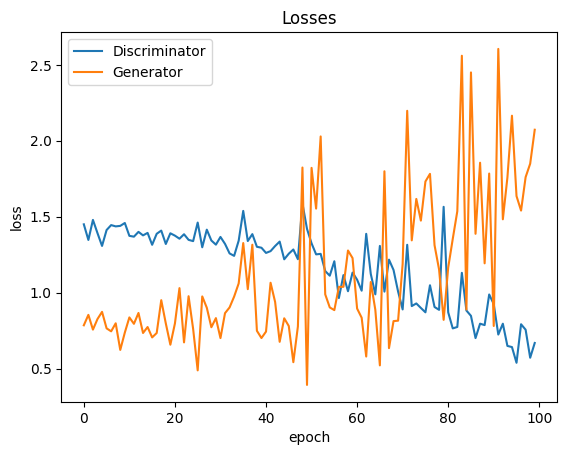

In [159]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

### ⇨ Plotting generator and discriminator scores at 200 epochs:

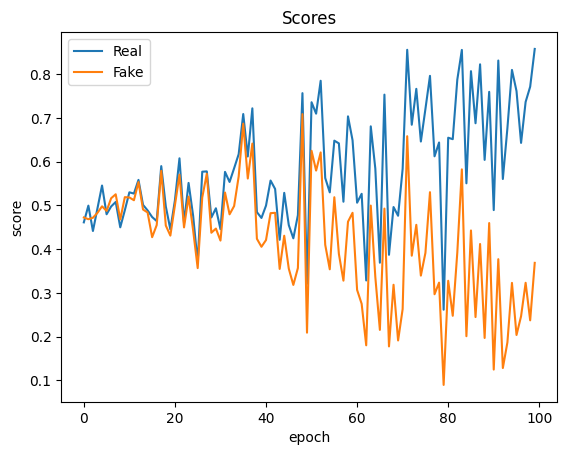

In [160]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');

### ⇨ Creating video slideshow of generated images from all 200 epochs:

In [161]:
vid_fname = 'gans_training_flowers_200.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 1, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

### ⇨ Saving the generator and discriminator from the 200 epoch training:

In [162]:
torch.save(generator.state_dict(), 'G_flowers_200.pth')
torch.save(discriminator.state_dict(), 'D_flowers_200.pth')

### ⇨ Generated images beyond 100 epochs up to 200 epochs:

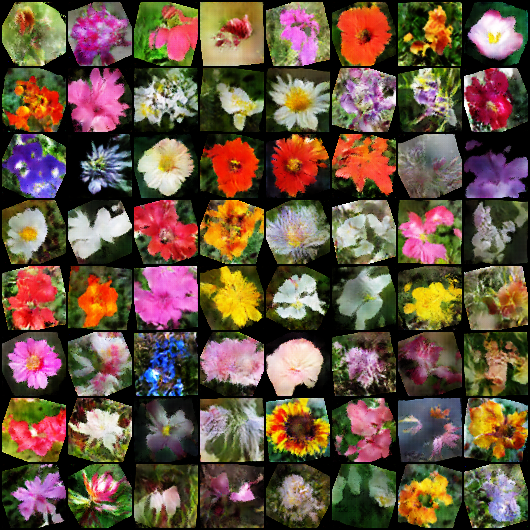

In [163]:
Image('./generated/generated-images-0125.png')

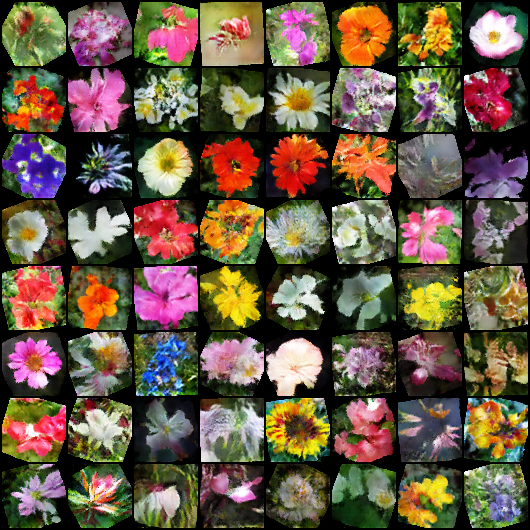

In [164]:
Image('./generated/generated-images-0150.png')

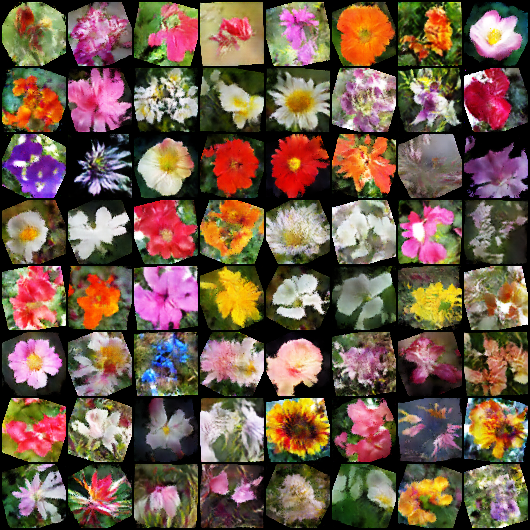

In [165]:
Image('./generated/generated-images-0175.png')

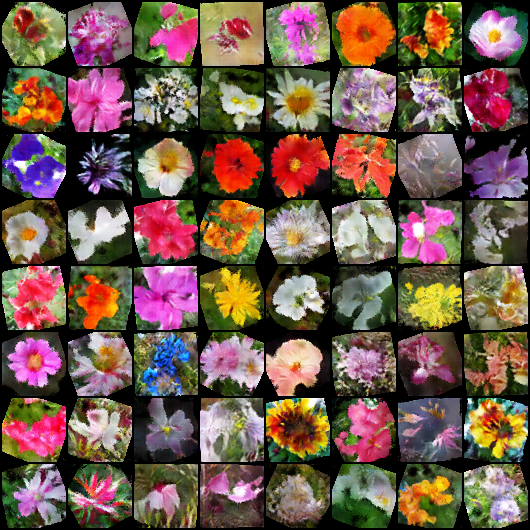

In [166]:
Image('./generated/generated-images-0200.png')